# STRATHMORE DATATHON CHALLENGE  

#### PROBLEM STATEMENT 
Bundas is a supermarket that has stores all over the country.Bundas has collected sales data for over 1000 products across its stores. ​Bundas has hired you as a data scientist to build a predictive model to find out the sales of each product at a particular store.  
Bundas plans on using this model to understand the properties of products and stores that play a paramount role in increasing sales

#### import libraries

In [1]:
#import libraries 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import itertools
import datetime as dt
from scipy import stats
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')
import os
import gc 
import pandas_profiling

##### Styles and aesthetics for the graphs 

In [8]:
#Setting styles and aesthetics
pd.options.display.max_columns =200
pd.options.display.max_rows =30
pd.options.display.float_format = '{:,.2f}'.format
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (18, 8)
# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'
%matplotlib inline

##### Load Data

In [9]:
#Read dataset
train_bundas=pd.read_csv('C:/Users/jonathan/Desktop/ilabdata/bundas_train.csv')
test_bundas = pd.read_csv('C:/Users/jonathan/Desktop/ilabdata/bundas_test.csv')

In [10]:
train_bundas['Item_ID'].unique()

array(['FDA15', 'DRC01', 'FDN15', ..., 'NCF55', 'NCW30', 'NCW05'],
      dtype=object)

In [11]:
train_bundas.Item_ID.unique() 


array(['FDA15', 'DRC01', 'FDN15', ..., 'NCF55', 'NCW30', 'NCW05'],
      dtype=object)

In [12]:
train_bundas["Item_ID"].value_counts()

FDG33    10
FDW13    10
FDQ40     9
FDX20     9
FDD38     9
         ..
FDE52     1
FDO33     1
FDQ60     1
FDK57     1
DRF48     1
Name: Item_ID, Length: 1559, dtype: int64

##### Data dimension

In [13]:
# Check The Shape Of The Data Loaded
print('Train bundas shape: {} Rows, {} Columns'.format(*train_bundas.shape))
print('Test bundas shape: {} Rows, {} Columns'.format(*test_bundas.shape))

Train bundas shape: 8523 Rows, 12 Columns
Test bundas shape: 5681 Rows, 11 Columns


##### First five rows of Data

In [14]:
# Print First Few Rows Of The Data
display("train bundas")
display(train_bundas.head(5))
display("test bundas")
display(test_bundas.head(5))

'train bundas'

,Item_ID,Weight,FatContent,Visibility,Category,Max_Price,Store_ID,Store_Establishment_Year,Store_Size,Store_Location_Type,Store_Type,Item_Store_Sales
0,FDA15,9.30,Low Fat,0.02,Dairy,249.81,OUT049,1999,Medium,Tier 1,Supermarket Type1,"3,735.14"
1,DRC01,5.92,Regular,0.02,Soft Drinks,48.27,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.42
2,FDN15,17.50,Low Fat,0.02,Meat,141.62,OUT049,1999,Medium,Tier 1,Supermarket Type1,"2,097.27"
3,FDX07,19.20,Regular,0.00,Fruits and Vegetables,182.09,OUT010,1998,NaN,Tier 3,Grocery Store,732.38
4,NCD19,8.93,Low Fat,0.00,Household,53.86,OUT013,1987,High,Tier 3,Supermarket Type1,994.71


'test bundas'

,Item_ID,Weight,FatContent,Visibility,Category,Max_Price,Store_ID,Store_Establishment_Year,Store_Size,Store_Location_Type,Store_Type
0,FDW58,20.75,Low Fat,0.01,Snack Foods,107.86,OUT049,1999,Medium,Tier 1,Supermarket Type1
1,FDW14,8.30,reg,0.04,Dairy,87.32,OUT017,2007,NaN,Tier 2,Supermarket Type1
2,NCN55,14.60,Low Fat,0.10,Others,241.75,OUT010,1998,NaN,Tier 3,Grocery Store
3,FDQ58,7.32,Low Fat,0.02,Snack Foods,155.03,OUT017,2007,NaN,Tier 2,Supermarket Type1
4,FDY38,nan,Regular,0.12,Dairy,234.23,OUT027,1985,Medium,Tier 3,Supermarket Type3


##### Description of the data

In [15]:
train_bundas.describe()

,Weight,Visibility,Max_Price,Store_Establishment_Year,Item_Store_Sales
count,"7,060.00","8,523.00","8,523.00","8,523.00","8,523.00"
mean,12.86,0.07,140.99,"1,997.83","2,181.29"
std,4.64,0.05,62.28,8.37,"1,706.50"
min,4.55,0.00,31.29,"1,985.00",33.29
25%,8.77,0.03,93.83,"1,987.00",834.25
50%,12.60,0.05,143.01,"1,999.00","1,794.33"
75%,16.85,0.09,185.64,"2,004.00","3,101.30"
max,21.35,0.33,266.89,"2,009.00","13,086.96"


In [16]:
test_bundas.describe()

,Weight,Visibility,Max_Price,Store_Establishment_Year
count,"4,705.00","5,681.00","5,681.00","5,681.00"
mean,12.70,0.07,141.02,"1,997.83"
std,4.66,0.05,61.81,8.37
min,4.55,0.00,31.99,"1,985.00"
25%,8.64,0.03,94.41,"1,987.00"
50%,12.50,0.05,141.42,"1,999.00"
75%,16.70,0.09,186.03,"2,004.00"
max,21.35,0.32,266.59,"2,009.00"


### Data exploration 

###### Checking null values 

In [17]:
# Checking Null values in Train Set
train_bundas.isnull().sum()

Item_ID                        0
Weight                      1463
FatContent                     0
Visibility                     0
Category                       0
Max_Price                      0
Store_ID                       0
Store_Establishment_Year       0
Store_Size                  2410
Store_Location_Type            0
Store_Type                     0
Item_Store_Sales               0
dtype: int64

In [18]:
# Checking Null values in test Set
test_bundas.isnull().sum()

Item_ID                        0
Weight                       976
FatContent                     0
Visibility                     0
Category                       0
Max_Price                      0
Store_ID                       0
Store_Establishment_Year       0
Store_Size                  1606
Store_Location_Type            0
Store_Type                     0
dtype: int64

##### Variable names of the data 

In [19]:
display("train bundas")
display(train_bundas.columns)
display("test bundas")
display(test_bundas.columns)

'train bundas'

Index(['Item_ID', 'Weight', 'FatContent', 'Visibility', 'Category',
       'Max_Price', 'Store_ID', 'Store_Establishment_Year', 'Store_Size',
       'Store_Location_Type', 'Store_Type', 'Item_Store_Sales'],
      dtype='object')

'test bundas'

Index(['Item_ID', 'Weight', 'FatContent', 'Visibility', 'Category',
       'Max_Price', 'Store_ID', 'Store_Establishment_Year', 'Store_Size',
       'Store_Location_Type', 'Store_Type'],
      dtype='object')

##### type of columns 

In [20]:
# Number of each type of column
display("train bundas")
display(train_bundas.dtypes.value_counts())
display("test bundas")
display(test_bundas.dtypes.value_counts())


'train bundas'

object     7
float64    4
int64      1
dtype: int64

'test bundas'

object     7
float64    3
int64      1
dtype: int64

In [21]:
train_bundas.dtypes

Item_ID                      object
Weight                      float64
FatContent                   object
Visibility                  float64
Category                     object
Max_Price                   float64
Store_ID                     object
Store_Establishment_Year      int64
Store_Size                   object
Store_Location_Type          object
Store_Type                   object
Item_Store_Sales            float64
dtype: object

In [22]:
test_bundas.dtypes

Item_ID                      object
Weight                      float64
FatContent                   object
Visibility                  float64
Category                     object
Max_Price                   float64
Store_ID                     object
Store_Establishment_Year      int64
Store_Size                   object
Store_Location_Type          object
Store_Type                   object
dtype: object

##### Structure of the data

Use pandas profiling to get summary details of each dataset



In [23]:
import pandas_profiling



An html file will be create in html folder, it will have the summary of the dataset 

In [16]:
profile = pandas_profiling.ProfileReport(train_bundas)
profile.to_file(output_file="C:/Users/jonathan/Desktop/ilabdata/html/bundas_train.htm")

In [17]:
profile = pandas_profiling.ProfileReport(test_bundas)
profile.to_file(output_file="C:/Users/jonathan/Desktop/ilabdata/html/bundas_test.htm")

### Explore each feature of the dataframe idividually 

###### fat content

In [24]:
train_bundas.loc[train_bundas['FatContent'] == 'LF', 'FatContent'] = 'Low Fat'
train_bundas.loc[train_bundas['FatContent'] == 'reg', 'FatContent'] = 'Regular'
train_bundas.loc[train_bundas['FatContent'] == 'low fat', 'FatContent'] = 'Low Fat'

In [25]:
train_bundas['FatContent'].unique()

array(['Low Fat', 'Regular'], dtype=object)

In [26]:
train_bundas["FatContent"].value_counts()

Low Fat    5517
Regular    3006
Name: FatContent, dtype: int64

###### Category

In [27]:
train_bundas['Category'].unique()

array(['Dairy', 'Soft Drinks', 'Meat', 'Fruits and Vegetables',
       'Household', 'Baking Goods', 'Snack Foods', 'Frozen Foods',
       'Breakfast', 'Health and Hygiene', 'Hard Drinks', 'Canned',
       'Breads', 'Starchy Foods', 'Others', 'Seafood'], dtype=object)

In [28]:
train_bundas["Category"].value_counts()

Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Category, dtype: int64

###### Store Establishment Year

In [29]:

train_bundas['Store_Establishment_Year'].unique()

array([1999, 2009, 1998, 1987, 1985, 2002, 2007, 1997, 2004], dtype=int64)

In [30]:
train_bundas["Store_Establishment_Year"].value_counts()

1985    1463
1987     932
1999     930
1997     930
2004     930
2002     929
2009     928
2007     926
1998     555
Name: Store_Establishment_Year, dtype: int64

###### Store_Size

In [31]:
train_bundas['Store_Size'].unique()

array(['Medium', nan, 'High', 'Small'], dtype=object)

In [32]:
train_bundas["Store_Size"].value_counts()

Medium    2793
Small     2388
High       932
Name: Store_Size, dtype: int64

###### Store_Location_Type

In [33]:
train_bundas['Store_Location_Type'].unique()

array(['Tier 1', 'Tier 3', 'Tier 2'], dtype=object)

In [34]:
train_bundas["Store_Location_Type"].value_counts()

Tier 3    3350
Tier 2    2785
Tier 1    2388
Name: Store_Location_Type, dtype: int64

###### Store_Type

In [35]:
train_bundas['Store_Type'].unique()

array(['Supermarket Type1', 'Supermarket Type2', 'Grocery Store',
       'Supermarket Type3'], dtype=object)

In [36]:
train_bundas["Store_Type"].value_counts()

Supermarket Type1    5577
Grocery Store        1083
Supermarket Type3     935
Supermarket Type2     928
Name: Store_Type, dtype: int64

###### Sales 

In [37]:
print('Highest Sales amount is:', train_bundas['Item_Store_Sales'].max())
print('Lowest Sales amount is:', train_bundas['Item_Store_Sales'].min())
print('Average Sales amount is:', train_bundas['Item_Store_Sales'].mean())
print('Median Sales amount is:', train_bundas['Item_Store_Sales'].median())

Highest Sales amount is: 13086.9648
Lowest Sales amount is: 33.29
Average Sales amount is: 2181.2889135750365
Median Sales amount is: 1794.331


###### Item

In [38]:
train_bundas['Item_ID'].unique()

array(['FDA15', 'DRC01', 'FDN15', ..., 'NCF55', 'NCW30', 'NCW05'],
      dtype=object)

In [39]:
train_bundas["Item_ID"].value_counts()

FDG33    10
FDW13    10
FDQ40     9
FDX20     9
FDD38     9
         ..
FDE52     1
FDO33     1
FDQ60     1
FDK57     1
DRF48     1
Name: Item_ID, Length: 1559, dtype: int64

###### Store

In [40]:
train_bundas['Store_ID'].unique()

array(['OUT049', 'OUT018', 'OUT010', 'OUT013', 'OUT027', 'OUT045',
       'OUT017', 'OUT046', 'OUT035', 'OUT019'], dtype=object)

In [41]:
train_bundas["Store_ID"].value_counts()

OUT027    935
OUT013    932
OUT035    930
OUT049    930
OUT046    930
OUT045    929
OUT018    928
OUT017    926
OUT010    555
OUT019    528
Name: Store_ID, dtype: int64

### Visual Exploration

In [42]:
import matplotlib.pyplot as plt


In [43]:
import seaborn as sns
# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(11, 4)})

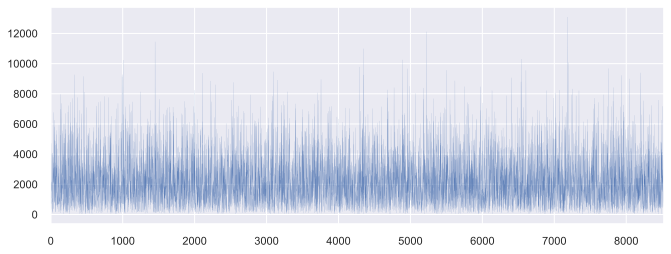

In [44]:
train_bundas['Item_Store_Sales'].plot(linewidth=0.1);


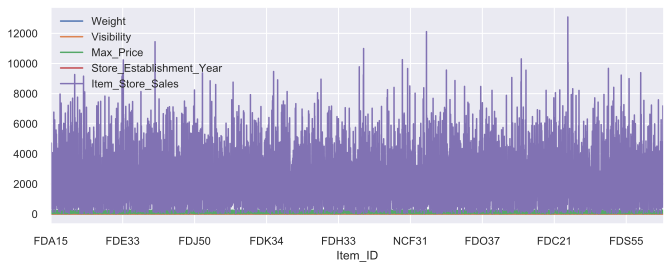

In [45]:
from pandas import read_csv
from matplotlib import pyplot
series = read_csv('bundas_train.csv', header=0, index_col=0, parse_dates=True, squeeze=True)
series.plot()
pyplot.show()

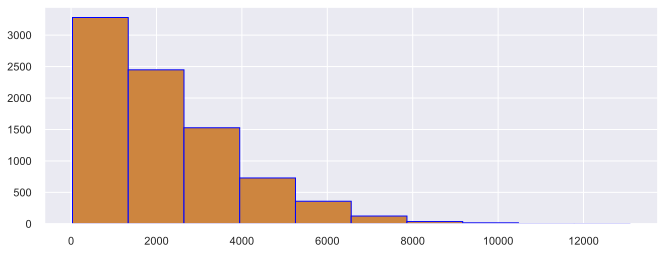

In [46]:
from pandas import read_csv
from matplotlib import pyplot
plt.hist(train_bundas['Item_Store_Sales'],
        facecolor='peru',
        edgecolor='blue',
        bins=10)
plt.show()


This is a left skew distribution



array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C2CAE619C8>,
      dtype=object)

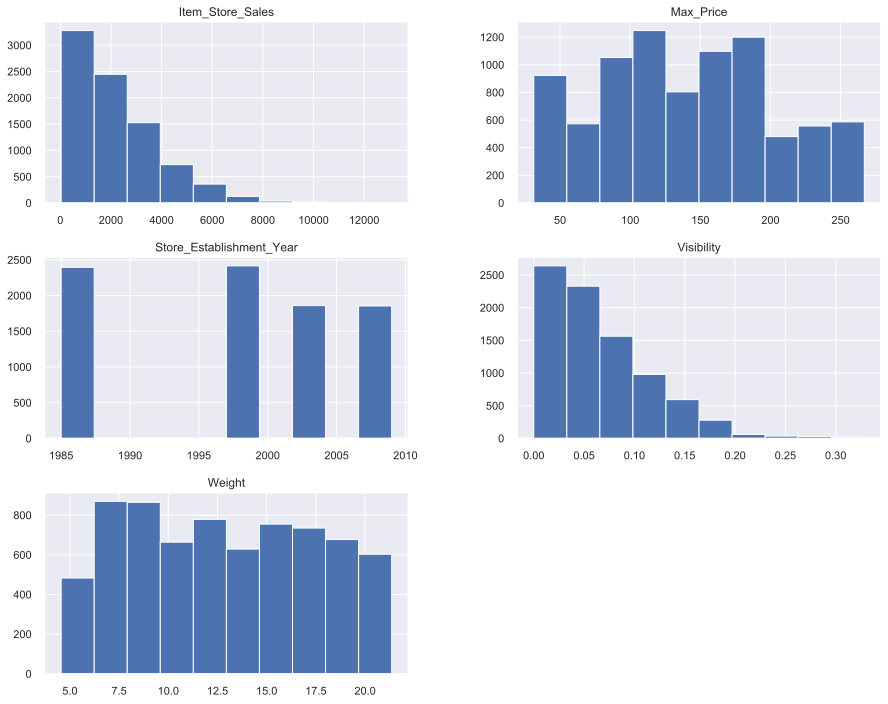

In [47]:
train_bundas.hist(figsize=(15,12))

###### Weight

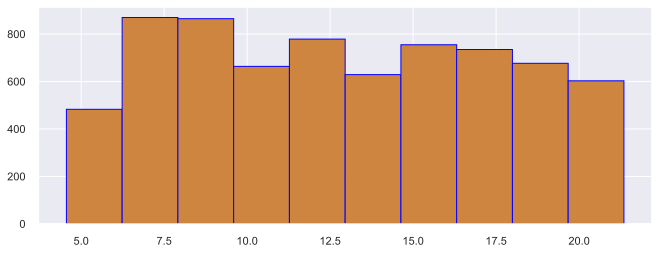

In [48]:
plt.hist(train_bundas['Weight'],
        facecolor='peru',
        edgecolor='blue',
        bins=10)
plt.show()

From this plot we can see that the weight of the items are distributed pretty equally.



###### Fat Content

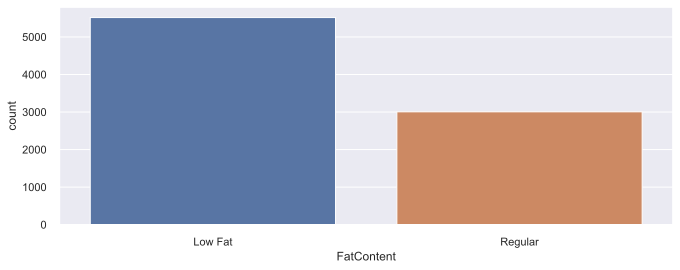

In [49]:
sns.countplot(train_bundas.FatContent)

we can see that the Low Fat products is the bigger part of the sales comparing with Regular fat

###### Category

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
 <a list of 16 Text xticklabel objects>)

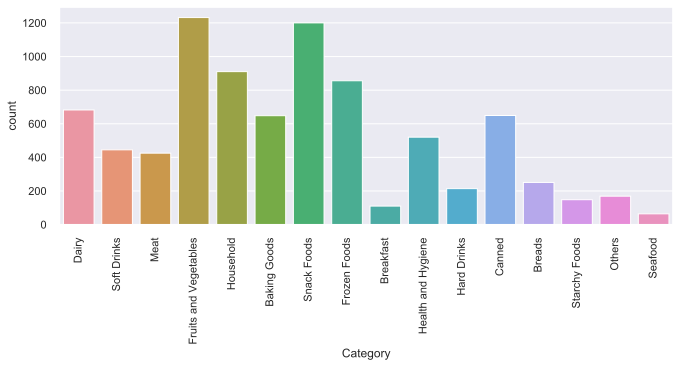

In [50]:
sns.countplot(train_bundas.Category)
plt.xticks(rotation=90)

 Fruits and Vegetables and Snack Foods are the first two categories in all sales. 

###### Store size

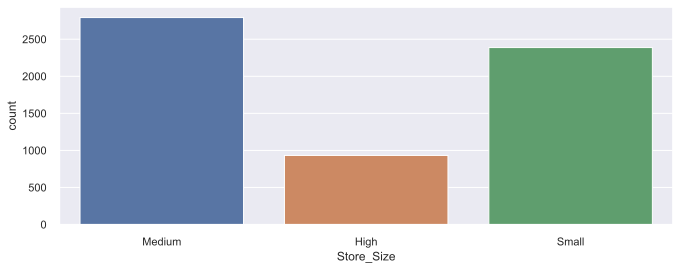

In [51]:
sns.countplot(train_bundas.Store_Size)


###### Store Location Type

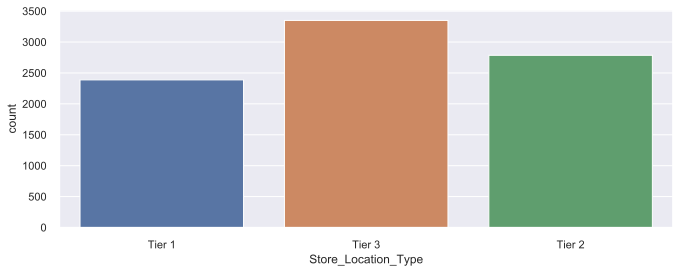

In [52]:
sns.countplot(train_bundas.Store_Location_Type)

###### Store Type

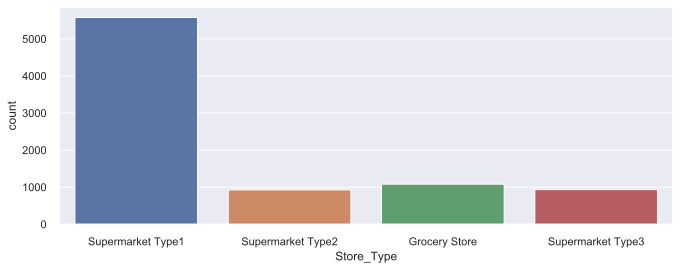

In [53]:
sns.countplot(train_bundas.Store_Type)

The Supermarket type 1 supermarket is the main form of Bundas, over 5000 places are  supermarket type 1. Others are around 1000 stores.

#### Weight and Item store Sales

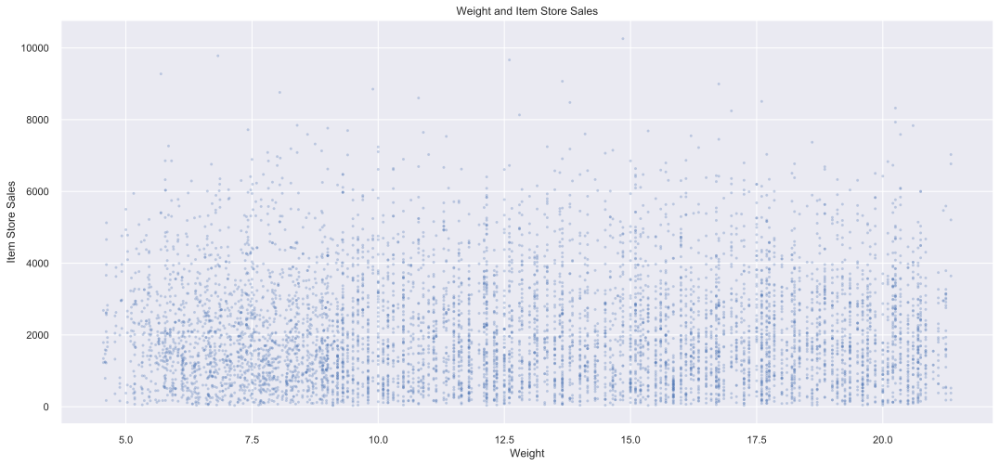

In [54]:
plt.figure(figsize=(18,8))
plt.xlabel("Weight")
plt.ylabel("Item Store Sales")
plt.title("Weight and Item Store Sales")
plt.plot(train_bundas.Weight, train_bundas["Item_Store_Sales"],'.', alpha = 0.3)

###### visibility and item store sales

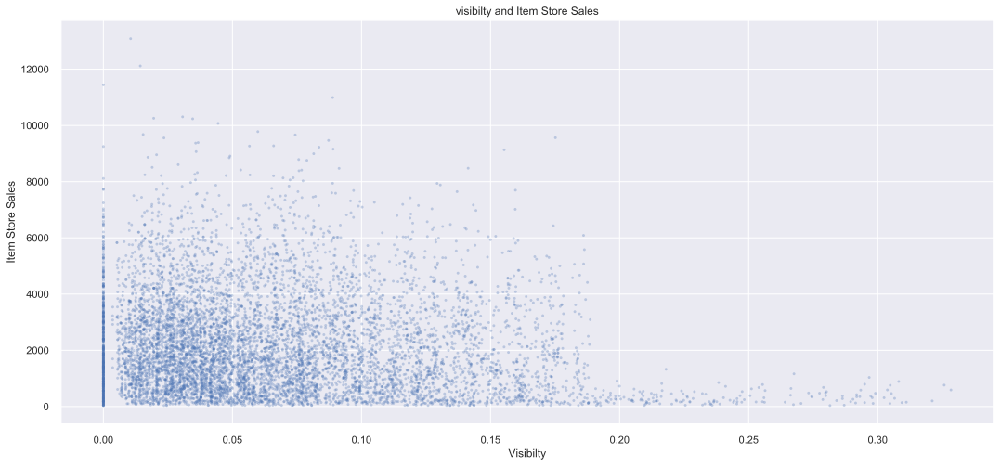

In [55]:
plt.figure(figsize=(18,8))
plt.xlabel("Visibilty")
plt.ylabel("Item Store Sales")
plt.title("visibilty and Item Store Sales")
plt.plot(train_bundas.Visibility, train_bundas["Item_Store_Sales"],'.', alpha = 0.3)

most of sales has been obtained from products whose visibility is less than 0.20

###### Category and item store sales

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
 <a list of 16 Text xticklabel objects>)

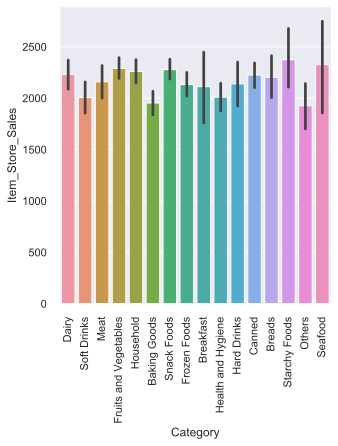

In [56]:
sns.catplot(x="Category", y="Item_Store_Sales", kind="bar", data=train_bundas);
plt.xticks(rotation=90)

Fruits and Vegetables, stanchy food, seafood contribute to the highest amount item store sales.


###### Fat content and Item Store Sales

(array([0, 1]), <a list of 2 Text xticklabel objects>)

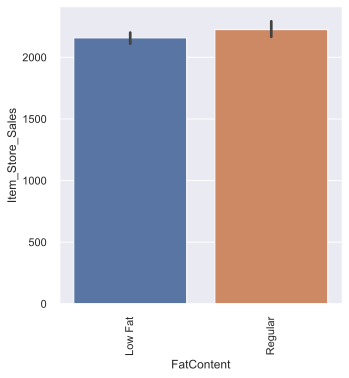

In [57]:
sns.catplot(x="FatContent", y="Item_Store_Sales", kind="bar", data=train_bundas);
plt.xticks(rotation=90)

###### Store and Item store sales

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text xticklabel objects>)

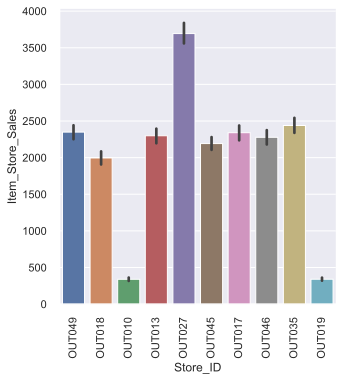

In [58]:
sns.catplot(x="Store_ID", y="Item_Store_Sales", kind="bar", data=train_bundas);
plt.xticks(rotation=90)

OUT027 store contributed the largest amount of the item store sales.



###### Store size and item store sale

(array([0, 1, 2]), <a list of 3 Text xticklabel objects>)

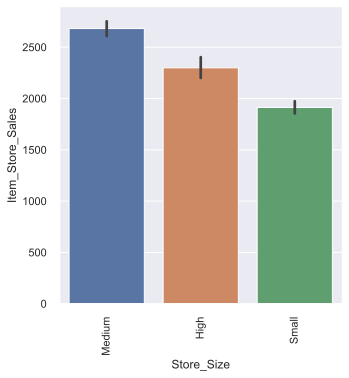

In [59]:
sns.catplot(x="Store_Size", y="Item_Store_Sales", kind="bar", data=train_bundas);
plt.xticks(rotation=90)

###### Store Location Type and Item Store Sales

(array([0, 1, 2]), <a list of 3 Text xticklabel objects>)

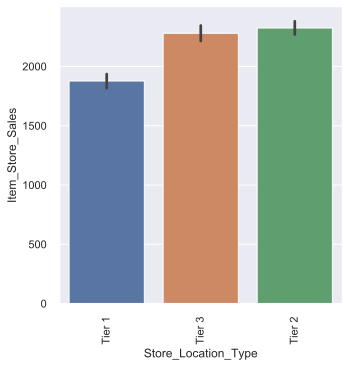

In [60]:
sns.catplot(x="Store_Location_Type", y="Item_Store_Sales", kind="bar", data=train_bundas);
plt.xticks(rotation=90)

###### Store Type and item Store Sales

(array([0, 1, 2, 3]), <a list of 4 Text xticklabel objects>)

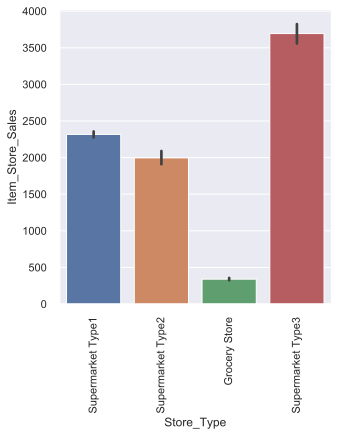

In [61]:
sns.catplot(x="Store_Type", y="Item_Store_Sales", kind="bar", data=train_bundas);
plt.xticks(rotation=90)

##### Store Establishment Year and item store sales

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]), <a list of 9 Text xticklabel objects>)

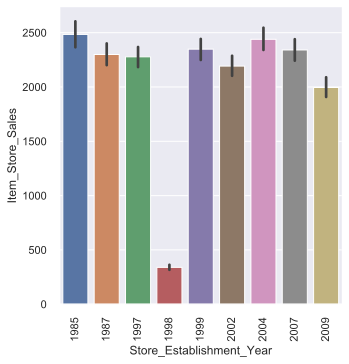

In [62]:
sns.catplot(x="Store_Establishment_Year", y="Item_Store_Sales", kind="bar", data=train_bundas);
plt.xticks(rotation=90)

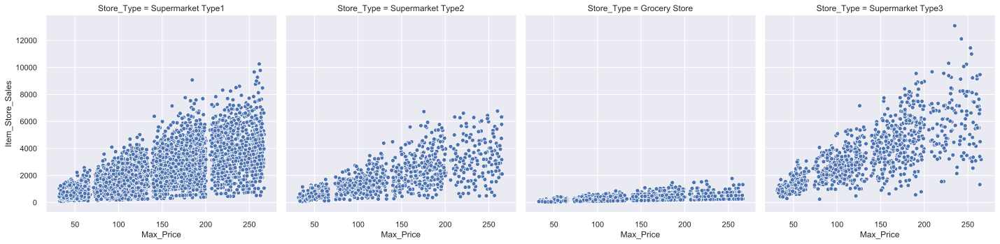

In [63]:
sns.relplot(x='Max_Price',y='Item_Store_Sales',col='Store_Type',data=train_bundas)

 Max_price and item store sales have relationship among 3 types of supermarkets in the Store Type columns, but the relationship
is not very visible in grocery store.

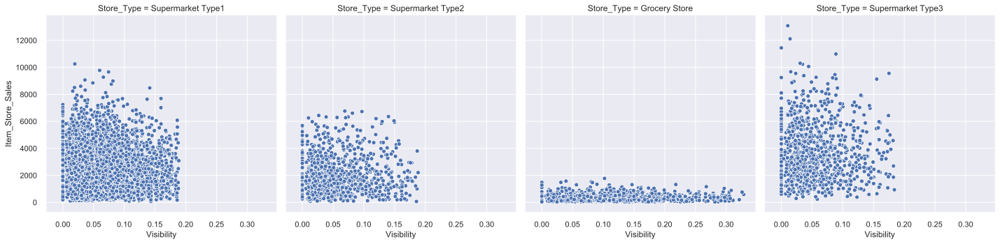

In [64]:
sns.relplot(x='Visibility',y='Item_Store_Sales',col='Store_Type',data=train_bundas)

in grocery stores, item visibility almost doesn’t affect sales, in supermarket types, it seems like while the visibility go higher, the sales is going down. this observation is not the same for the 4, to be safe i will say that visibility doesn't a strong impact to the sales


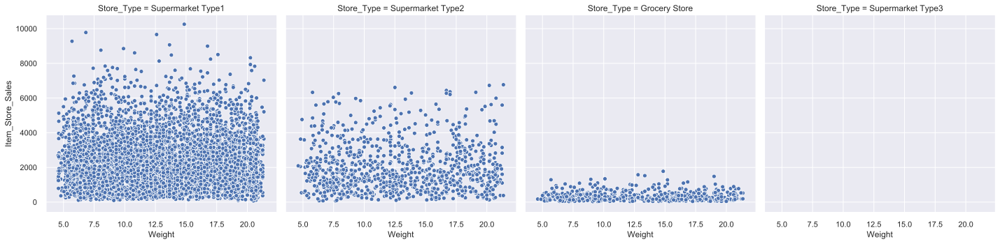

In [65]:
sns.relplot(x='Weight',y='Item_Store_Sales',col='Store_Type',data=train_bundas)

the weight doesn't affect the items store sales

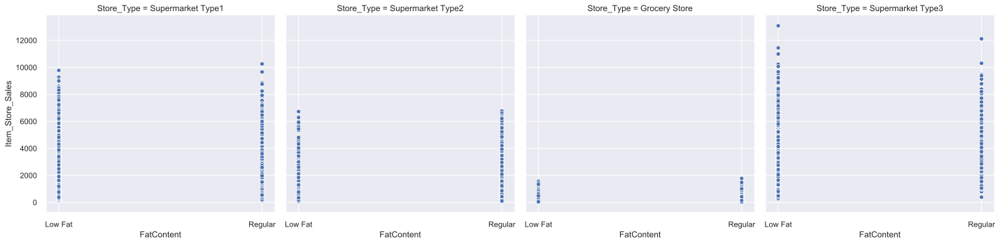

In [152]:
sns.relplot(x='FatContent',y='Item_Store_Sales',col='Store_Type',data=train_bundas)

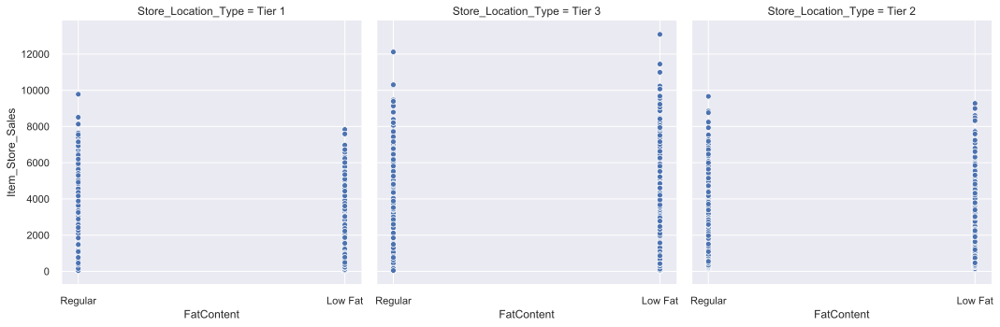

In [182]:
sns.relplot(x='FatContent',y='Item_Store_Sales',col='Store_Location_Type',data=train_bundas)

In [178]:
from matplotlib import pyplot as plt
import seaborn as sns

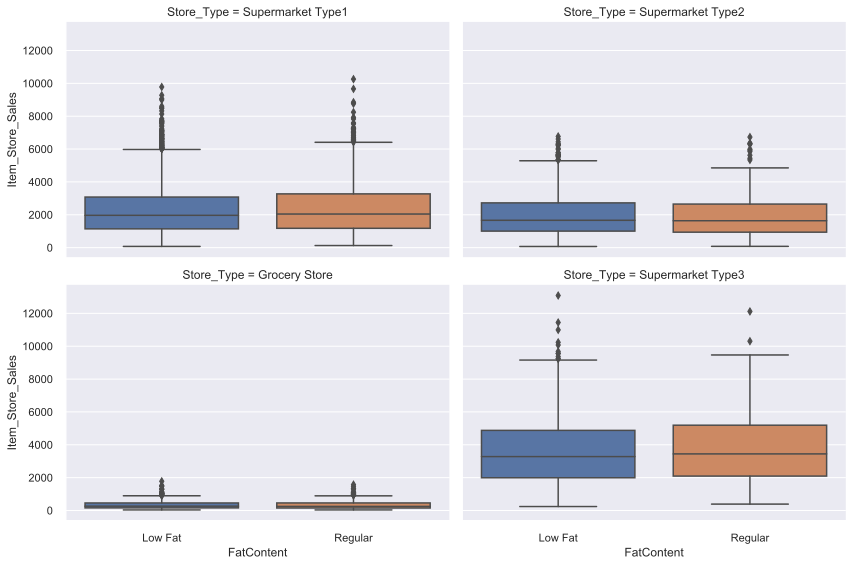

In [181]:
grid = sns.catplot(x='FatContent', y='Item_Store_Sales', col='Store_Type', col_wrap=2, data=train_bundas, kind='box', height=4, aspect=1.5)


the low fat and regular sales in supermarket 3 and tier 3 are higher than others,  also tier 3 has the all the item store sales



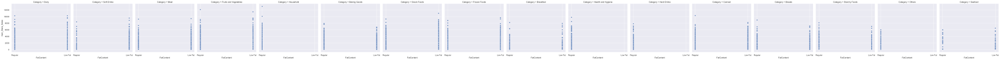

In [183]:
sns.relplot(x='FatContent',y='Item_Store_Sales',col='Category',data=train_bundas)

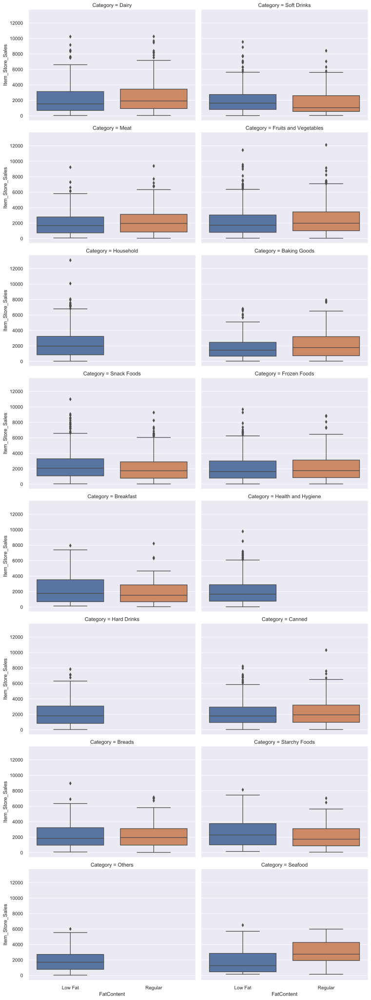

In [184]:
grid = sns.catplot(x='FatContent', y='Item_Store_Sales', col='Category', col_wrap=2, data=train_bundas, kind='box', height=4, aspect=1.5)


## Feature engineering

##### imputer missing value with the means

In [66]:
from sklearn.preprocessing import Imputer

In [67]:
# code in r for weight 

In [70]:
 
df_mean_imputed = pd.read_csv('C:/Users/jonathan/Desktop/ilabdata/comp_bundas_train.csv')

In [71]:
# Checking Null values in test Set
df_mean_imputed.isnull().sum()

Unnamed: 0                  0
Item_ID                     0
Weight                      0
FatContent                  0
Visibility                  0
Category                    0
Max_Price                   0
Store_ID                    0
Store_Establishment_Year    0
Store_Size                  0
Store_Location_Type         0
Store_Type                  0
Item_Store_Sales            0
tracker                     0
dtype: int64

In [77]:
# pandas drop a column with drop function
df_mean_imputed.drop(['tracker'], axis=1)

,Unnamed: 0,Item_ID,Weight,FatContent,Visibility,Category,Max_Price,Store_ID,Store_Establishment_Year,Store_Size,Store_Location_Type,Store_Type,Item_Store_Sales
0,1,FDA15,9.30,Low Fat,0.02,Dairy,249.81,OUT049,1999,Medium,Tier 1,Supermarket Type1,"3,735.14"
1,2,DRC01,5.92,Regular,0.02,Soft Drinks,48.27,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.42
2,3,FDN15,17.50,Low Fat,0.02,Meat,141.62,OUT049,1999,Medium,Tier 1,Supermarket Type1,"2,097.27"
3,5,NCD19,8.93,Low Fat,0.00,Household,53.86,OUT013,1987,High,Tier 3,Supermarket Type1,994.71
4,6,FDP36,10.39,Regular,0.00,Baking Goods,51.40,OUT018,2009,Medium,Tier 3,Supermarket Type2,556.61
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6104,14591,DRK37,5.00,Low Fat,0.04,Soft Drinks,189.05,OUT027,1985,Medium,Tier 3,Supermarket Type3,"6,261.85"
6105,14601,DRG13,17.25,Low Fat,0.04,Soft Drinks,164.75,OUT027,1985,Medium,Tier 3,Supermarket Type3,"4,111.31"
6106,14611,NCN14,19.10,Low Fat,0.09,Others,184.66,OUT027,1985,Medium,Tier 3,Supermarket Type3,"2,756.41"
6107,14621,FDU44,12.15,Regular,0.10,Fruits and Vegetables,162.36,OUT019,1985,Small,Tier 1,Grocery Store,487.37


In [78]:
df_mean_imputed.dropna()

,Unnamed: 0,Item_ID,Weight,FatContent,Visibility,Category,Max_Price,Store_ID,Store_Establishment_Year,Store_Size,Store_Location_Type,Store_Type,Item_Store_Sales,tracker
0,1,FDA15,9.30,Low Fat,0.02,Dairy,249.81,OUT049,1999,Medium,Tier 1,Supermarket Type1,"3,735.14",1
1,2,DRC01,5.92,Regular,0.02,Soft Drinks,48.27,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.42,2
2,3,FDN15,17.50,Low Fat,0.02,Meat,141.62,OUT049,1999,Medium,Tier 1,Supermarket Type1,"2,097.27",3
3,5,NCD19,8.93,Low Fat,0.00,Household,53.86,OUT013,1987,High,Tier 3,Supermarket Type1,994.71,5
4,6,FDP36,10.39,Regular,0.00,Baking Goods,51.40,OUT018,2009,Medium,Tier 3,Supermarket Type2,556.61,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6104,14591,DRK37,5.00,Low Fat,0.04,Soft Drinks,189.05,OUT027,1985,Medium,Tier 3,Supermarket Type3,"6,261.85",8486
6105,14601,DRG13,17.25,Low Fat,0.04,Soft Drinks,164.75,OUT027,1985,Medium,Tier 3,Supermarket Type3,"4,111.31",8488
6106,14611,NCN14,19.10,Low Fat,0.09,Others,184.66,OUT027,1985,Medium,Tier 3,Supermarket Type3,"2,756.41",8489
6107,14621,FDU44,12.15,Regular,0.10,Fruits and Vegetables,162.36,OUT019,1985,Small,Tier 1,Grocery Store,487.37,8491


In [79]:

modDf = df_mean_imputed.dropna(how='any', subset=['Store_Size'])

In [80]:
modDf.head(20)

,Unnamed: 0,Item_ID,Weight,FatContent,Visibility,Category,Max_Price,Store_ID,Store_Establishment_Year,Store_Size,Store_Location_Type,Store_Type,Item_Store_Sales,tracker
0,1,FDA15,9.30,Low Fat,0.02,Dairy,249.81,OUT049,1999,Medium,Tier 1,Supermarket Type1,"3,735.14",1
1,2,DRC01,5.92,Regular,0.02,Soft Drinks,48.27,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.42,2
2,3,FDN15,17.50,Low Fat,0.02,Meat,141.62,OUT049,1999,Medium,Tier 1,Supermarket Type1,"2,097.27",3
3,5,NCD19,8.93,Low Fat,0.00,Household,53.86,OUT013,1987,High,Tier 3,Supermarket Type1,994.71,5
4,6,FDP36,10.39,Regular,0.00,Baking Goods,51.40,OUT018,2009,Medium,Tier 3,Supermarket Type2,556.61,6
5,7,FDO10,13.65,Regular,0.01,Snack Foods,57.66,OUT013,1987,High,Tier 3,Supermarket Type1,343.55,7
6,11,FDY07,11.80,Low Fat,0.00,Fruits and Vegetables,45.54,OUT049,1999,Medium,Tier 1,Supermarket Type1,"1,516.03",11
7,12,FDA03,18.50,Regular,0.05,Dairy,144.11,OUT046,1997,Small,Tier 1,Supermarket Type1,"2,187.15",12
8,13,FDX32,15.10,Regular,0.10,Fruits and Vegetables,145.48,OUT049,1999,Medium,Tier 1,Supermarket Type1,"1,589.26",13
9,14,FDS46,17.60,Regular,0.05,Snack Foods,119.68,OUT046,1997,Small,Tier 1,Supermarket Type1,"2,145.21",14


In [81]:
modDf.isnull().sum()

Unnamed: 0                  0
Item_ID                     0
Weight                      0
FatContent                  0
Visibility                  0
Category                    0
Max_Price                   0
Store_ID                    0
Store_Establishment_Year    0
Store_Size                  0
Store_Location_Type         0
Store_Type                  0
Item_Store_Sales            0
tracker                     0
dtype: int64

In [82]:
modDf.dtypes

Unnamed: 0                    int64
Item_ID                      object
Weight                      float64
FatContent                   object
Visibility                  float64
Category                     object
Max_Price                   float64
Store_ID                     object
Store_Establishment_Year      int64
Store_Size                   object
Store_Location_Type          object
Store_Type                   object
Item_Store_Sales            float64
tracker                       int64
dtype: object

##### Check correlation between features

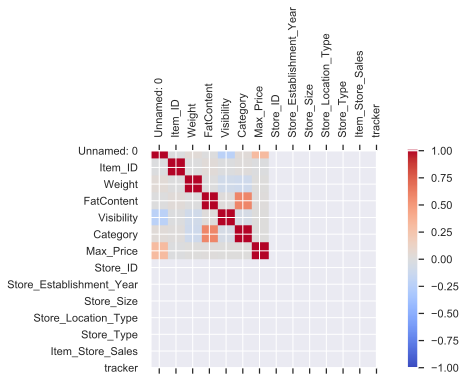

In [83]:
corr = modDf.corr()
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(modDf.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(modDf.columns)
ax.set_yticklabels(modDf.columns)
plt.show()

In [162]:
corr = modDf.corr()

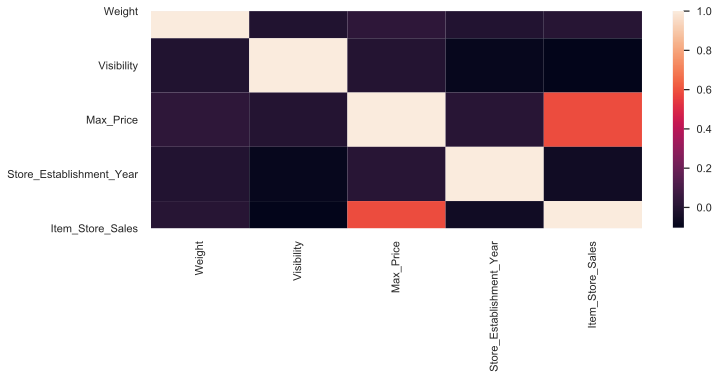

In [163]:
sns.heatmap(corr)


###### Identify Highly Correlated Features

In [164]:
# Create correlation matrix
corr_matrix = modDf.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

In [165]:
# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

In [166]:
# Drop features 
modDf.drop(modDf[to_drop], axis=1)

,Item_ID,Weight,FatContent,Visibility,Category,Max_Price,Store_ID,Store_Establishment_Year,Store_Size,Store_Location_Type,Store_Type,Item_Store_Sales
0,FDA15,9.30,Low Fat,0.02,Dairy,249.81,OUT049,1999,Medium,Tier 1,Supermarket Type1,"3,735.14"
1,DRC01,5.92,Regular,0.02,Soft Drinks,48.27,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.42
2,FDN15,17.50,Low Fat,0.02,Meat,141.62,OUT049,1999,Medium,Tier 1,Supermarket Type1,"2,097.27"
4,NCD19,8.93,Low Fat,0.00,Household,53.86,OUT013,1987,High,Tier 3,Supermarket Type1,994.71
5,FDP36,10.39,Regular,0.00,Baking Goods,51.40,OUT018,2009,Medium,Tier 3,Supermarket Type2,556.61
...,...,...,...,...,...,...,...,...,...,...,...,...
8517,FDF53,20.75,Regular,0.08,Frozen Foods,178.83,OUT046,1997,Small,Tier 1,Supermarket Type1,"3,608.64"
8518,FDF22,6.87,Low Fat,0.06,Snack Foods,214.52,OUT013,1987,High,Tier 3,Supermarket Type1,"2,778.38"
8520,NCJ29,10.60,Low Fat,0.04,Health and Hygiene,85.12,OUT035,2004,Small,Tier 2,Supermarket Type1,"1,193.11"
8521,FDN46,7.21,Regular,0.15,Snack Foods,103.13,OUT018,2009,Medium,Tier 3,Supermarket Type2,"1,845.60"


###### encode categorival variables

In [167]:
# One hot encode the categorical columns
FatContent_one_hot = pd.get_dummies(modDf['FatContent'], 
                                     prefix='FatContent')

Category_one_hot = pd.get_dummies(modDf['Category'], 
                                prefix='Category')

Store_Size_one_hot = pd.get_dummies(modDf['Store_Size'], 
                                   prefix='Store_Size')

# One hot encode the categorical columns
Store_Location_Type_one_hot = pd.get_dummies(modDf['Store_Location_Type'], 
                                     prefix='Store_Location_Type')

Store_Type_one_hot = pd.get_dummies(modDf['Store_Type'], 
                                prefix='Store_Type')

Store_ID_one_hot = pd.get_dummies(modDf['Store_ID'], 
                                   prefix='Store_ID')





In [168]:
# Combine the one hot encoded columns with df_con_enc
modDfenc = pd.concat([modDf, 
                        FatContent_one_hot, 
                        Category_one_hot, 
                        Store_Size_one_hot,
                        Store_Location_Type_one_hot, 
                        Store_Type_one_hot, 
                        Store_ID_one_hot], axis=1)

# Drop the original categorical columns (because now they've been one hot encoded)
modDfenc = modDfenc.drop(['FatContent','Category','Store_Size','Store_Location_Type','Store_Type','Store_ID'], axis=1)

In [169]:
# Let's look at df_con_enc
modDfenc.head(20)

,Item_ID,Weight,Visibility,Max_Price,Store_Establishment_Year,Item_Store_Sales,FatContent_Low Fat,FatContent_Regular,Category_Baking Goods,Category_Breads,Category_Breakfast,Category_Canned,Category_Dairy,Category_Frozen Foods,Category_Fruits and Vegetables,Category_Hard Drinks,Category_Health and Hygiene,Category_Household,Category_Meat,Category_Others,Category_Seafood,Category_Snack Foods,Category_Soft Drinks,Category_Starchy Foods,Store_Size_High,Store_Size_Medium,Store_Size_Small,Store_Location_Type_Tier 1,Store_Location_Type_Tier 2,Store_Location_Type_Tier 3,Store_Type_Grocery Store,Store_Type_Supermarket Type1,Store_Type_Supermarket Type2,Store_Type_Supermarket Type3,Store_ID_OUT013,Store_ID_OUT018,Store_ID_OUT019,Store_ID_OUT027,Store_ID_OUT035,Store_ID_OUT046,Store_ID_OUT049
0,FDA15,9.30,0.02,249.81,1999,"3,735.14",1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
1,DRC01,5.92,0.02,48.27,2009,443.42,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0
2,FDN15,17.50,0.02,141.62,1999,"2,097.27",1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
4,NCD19,8.93,0.00,53.86,1987,994.71,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0
5,FDP36,10.39,0.00,51.40,2009,556.61,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0
6,FDO10,13.65,0.01,57.66,1987,343.55,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0
7,FDP10,12.86,0.13,107.76,1985,"4,022.76",1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0
10,FDY07,11.80,0.00,45.54,1999,"1,516.03",1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
11,FDA03,18.50,0.05,144.11,1997,"2,187.15",0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0
12,FDX32,15.10,0.10,145.48,1999,"1,589.26",0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1


### Start Building Machine Learning Models


### Let's seperate the data


In [170]:
# Seclect the dataframe we want to use first for predictions
selected_df = modDfenc

In [171]:
selected_df.head()


,Item_ID,Weight,Visibility,Max_Price,Store_Establishment_Year,Item_Store_Sales,FatContent_Low Fat,FatContent_Regular,Category_Baking Goods,Category_Breads,Category_Breakfast,Category_Canned,Category_Dairy,Category_Frozen Foods,Category_Fruits and Vegetables,Category_Hard Drinks,Category_Health and Hygiene,Category_Household,Category_Meat,Category_Others,Category_Seafood,Category_Snack Foods,Category_Soft Drinks,Category_Starchy Foods,Store_Size_High,Store_Size_Medium,Store_Size_Small,Store_Location_Type_Tier 1,Store_Location_Type_Tier 2,Store_Location_Type_Tier 3,Store_Type_Grocery Store,Store_Type_Supermarket Type1,Store_Type_Supermarket Type2,Store_Type_Supermarket Type3,Store_ID_OUT013,Store_ID_OUT018,Store_ID_OUT019,Store_ID_OUT027,Store_ID_OUT035,Store_ID_OUT046,Store_ID_OUT049
0,FDA15,9.30,0.02,249.81,1999,"3,735.14",1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
1,DRC01,5.92,0.02,48.27,2009,443.42,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0
2,FDN15,17.50,0.02,141.62,1999,"2,097.27",1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
4,NCD19,8.93,0.00,53.86,1987,994.71,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0
5,FDP36,10.39,0.00,51.40,2009,556.61,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0


In [172]:
# Split the dataframe into data and labels
X_train = selected_df.drop('Item_Store_Sales', axis=1) # data
y_train = selected_df.Item_Store_Sales # labels

In [173]:
# Shape of the data (without labels)
X_train.shape

(6113, 40)

In [174]:
X_train.head()

,Item_ID,Weight,Visibility,Max_Price,Store_Establishment_Year,FatContent_Low Fat,FatContent_Regular,Category_Baking Goods,Category_Breads,Category_Breakfast,Category_Canned,Category_Dairy,Category_Frozen Foods,Category_Fruits and Vegetables,Category_Hard Drinks,Category_Health and Hygiene,Category_Household,Category_Meat,Category_Others,Category_Seafood,Category_Snack Foods,Category_Soft Drinks,Category_Starchy Foods,Store_Size_High,Store_Size_Medium,Store_Size_Small,Store_Location_Type_Tier 1,Store_Location_Type_Tier 2,Store_Location_Type_Tier 3,Store_Type_Grocery Store,Store_Type_Supermarket Type1,Store_Type_Supermarket Type2,Store_Type_Supermarket Type3,Store_ID_OUT013,Store_ID_OUT018,Store_ID_OUT019,Store_ID_OUT027,Store_ID_OUT035,Store_ID_OUT046,Store_ID_OUT049
0,FDA15,9.30,0.02,249.81,1999,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
1,DRC01,5.92,0.02,48.27,2009,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0
2,FDN15,17.50,0.02,141.62,1999,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
4,NCD19,8.93,0.00,53.86,1987,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0
5,FDP36,10.39,0.00,51.40,2009,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0


In [175]:
# Shape of the labels
y_train.shape

(6113,)

In [176]:
selected_df.to_csv("C:/Users/jonathan/Desktop/ilabdata/train_modified.csv",index=False)

### Linear Regression Model

### Decision Tree Model

### Random Forrest Model

##### encode categorical variables

Since scikit-learn only accepts numerical variables, we need to convert all categories of nominal variables into numeric types

In [60]:
#Import library:
#from sklearn.preprocessing import LabelEncoder
#le = LabelEncoder()

In [61]:
#New variable for Store_ID
#modDf['Outlet'] = le.fit_transform(modDf['Store_ID'])

In [62]:
#var_mod = ['FatContent','Category','Store_Size','Store_Location_Type','Store_Type','Store_ID']

In [63]:
#for i in var_mod:
#    modDf[i] = le.fit_transform(modDf[i])

In [64]:
#Dummy Variables:
#modDf = pd.get_dummies(modDf, 
#                      columns =['FatContent','Category','Store_Size','Store_Location_Type','Store_Type','Store_ID'])

In [65]:
#modDf.dtypes

Item_ID                      object
Weight                      float64
Visibility                  float64
Max_Price                   float64
Store_Establishment_Year      int64
                             ...   
Store_ID_2                    uint8
Store_ID_3                    uint8
Store_ID_4                    uint8
Store_ID_5                    uint8
Store_ID_6                    uint8
Length: 45, dtype: object

##### exporting data

In [66]:
#Export files as modified versions:
#modDf.to_csv("C:/Users/jonathan/Desktop/ilabdata/train_modified.csv",index=False)

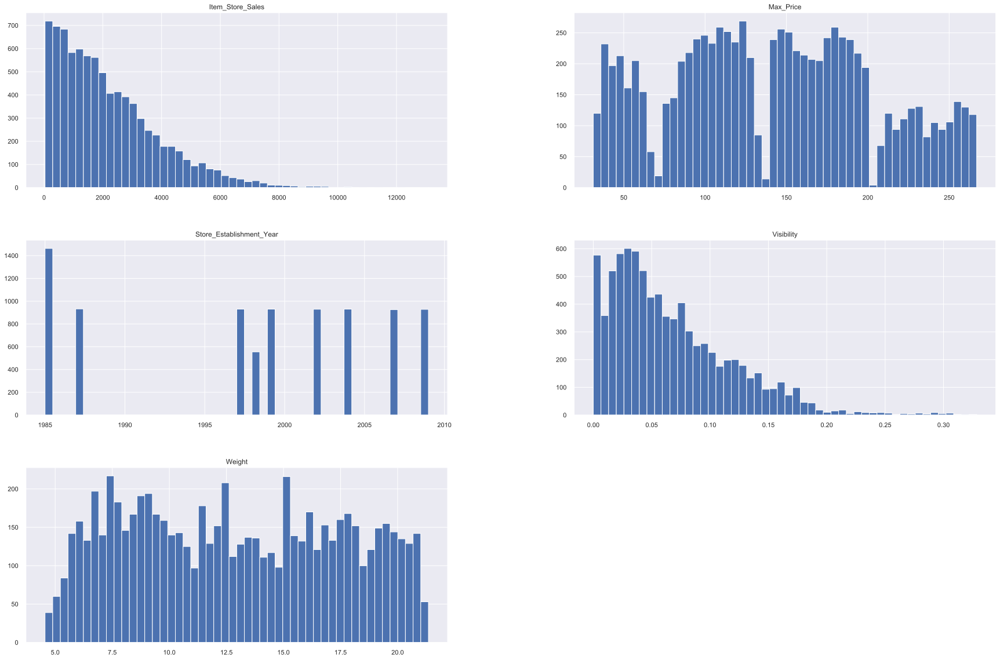

In [98]:
train_bundas.hist(bins=50, figsize=(30,20));